# Import

In [ ]:
import os
import shutil
import random
import numpy as np
from tqdm import tqdm
from PIL import Image
from collections import defaultdict
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import tensorflowjs as tfjs

# Data Preparation

Dataset of diseased plant leaf from: https://github.com/spMohanty/PlantVillage-Dataset/tree/master/raw/color

## Download Data

**Mendownload Folder Tertentu dari GitHub Menggunakan `git sparse-checkout`**

Langkah-langkah mendownload folder `raw/color`:

1. Inisialisasi repositori Git kosong di dalam folder baru
   
    ```bash
    git init PlantVillage-Dataset
    cd PlantVillage-Dataset

2. Tambahkan URL repositori sebagai remote
   
    ```bash
    git remote add origin https://github.com/spMohanty/PlantVillage-Dataset.git

3. Aktifkan fitur sparse-checkout untuk mendownload hanya folder tertentu

    ```bash
    git config core.sparseCheckout true

4. Tentukan folder yang akan didownload dengan memasukkannya ke file sparse-checkout

    ```bash
    echo "raw/color" >> .git/info/sparse-checkout

5. Tarik (pull) isi folder yang ditentukan dari repositori

    ```bash
    git pull origin master

**Hasil**

PlantVillage-Dataset pada raw/color folder yang berisi 38 class of data

## Data Loading

In [ ]:
def analyze_image_folder(folder_path):
    """
    Mengecek jumlah kelas/subfolder di dalam folder utama, menampilkan nama setiap kelas,
    menghitung jumlah gambar di dalam setiap kelas, dan mendapatkan resolusi unik setiap gambar.

    Parameters:
    folder_path (str): Path ke folder utama yang berisi subfolder dari setiap kelas.

    Returns:
    dict: Sebuah dictionary dengan struktur:
            {
                "total_classes": int,                   # Jumlah total kelas/subfolder
                "total_images": int,                    # Total jumlah gambar dalam semua kelas
                "unique_resolutions": list,             # Resolusi unik yang ditemukan dalam dataset
                "class_details": {                      # Informasi detail setiap kelas
                    "class_name": {                     # Nama subfolder/kelas
                        "image_count": int,             # Jumlah gambar di kelas tersebut
                        "unique_resolutions": list      # Resolusi unik dari gambar dalam kelas
                    },
                    ...
                }
            }
    """
    result = {"total_classes": 0, "total_images": 0, "unique_resolutions": set(), "class_details": {}}

    # List subfolder sebagai kelas
    classes = [d for d in os.listdir(folder_path) if os.path.isdir(os.path.join(folder_path, d))]
    result["total_classes"] = len(classes)

    # Menggunakan tqdm untuk progress bar pada setiap kelas
    for class_name in tqdm(classes, desc="Processing classes"):
        class_path = os.path.join(folder_path, class_name)
        images = [f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))]

        image_count = 0
        class_resolutions = set()  # Set untuk menyimpan resolusi unik per kelas

        # Progress bar untuk setiap gambar dalam kelas
        for image_name in tqdm(images, desc=f"Processing images in {class_name}", leave=False):
            image_path = os.path.join(class_path, image_name)
            try:
                with Image.open(image_path) as img:
                    resolution = img.size  # (width, height)
                    class_resolutions.add(resolution)
                    result["unique_resolutions"].add(resolution)  # Tambahkan ke resolusi unik global
                    image_count += 1
                    result["total_images"] += 1
            except Exception as e:
                print(f"Could not process {image_name}: {e}")

        result["class_details"][class_name] = {
            "image_count": image_count,
            "unique_resolutions": list(class_resolutions)  # Convert set to list
        }

    # Convert unique resolutions set to list for JSON compatibility
    result["unique_resolutions"] = list(result["unique_resolutions"])

    return result


folder_path = "PlantVillage-Dataset/raw/color/"
info = analyze_image_folder(folder_path)

# Print summary
print(f"Total Classes: {info['total_classes']}")
print(f"Total Images: {info['total_images']}")
print(f"Unique Resolutions: {info['unique_resolutions']}")

# Print detail per kelas
for class_name, details in info["class_details"].items():
    print(f"\nClass: {class_name}")
    print(f"Image Count: {details['image_count']}")
    print(f"Unique Resolutions: {details['unique_resolutions']}")


Processing classes: 100%|██████████| 38/38 [00:13<00:00,  2.84it/s]

Total Classes: 38
Total Images: 54305
Unique Resolutions: [(256, 256)]

Class: Apple___Apple_scab
Image Count: 630
Unique Resolutions: [(256, 256)]

Class: Apple___Black_rot
Image Count: 621
Unique Resolutions: [(256, 256)]

Class: Apple___Cedar_apple_rust
Image Count: 275
Unique Resolutions: [(256, 256)]

Class: Apple___healthy
Image Count: 1645
Unique Resolutions: [(256, 256)]

Class: Blueberry___healthy
Image Count: 1502
Unique Resolutions: [(256, 256)]

Class: Cherry_(including_sour)___healthy
Image Count: 854
Unique Resolutions: [(256, 256)]

Class: Cherry_(including_sour)___Powdery_mildew
Image Count: 1052
Unique Resolutions: [(256, 256)]

Class: Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
Image Count: 513
Unique Resolutions: [(256, 256)]

Class: Corn_(maize)___Common_rust_
Image Count: 1192
Unique Resolutions: [(256, 256)]

Class: Corn_(maize)___healthy
Image Count: 1162
Unique Resolutions: [(256, 256)]

Class: Corn_(maize)___Northern_Leaf_Blight
Image Count: 985
Unique R

## Data Preprocessing

Gambar-gambar pada dataset masih memiliki resolusi yang seragam sehingga dilakukan perubahan sehingga data memiliki resolusi yang tidak seragam.

In [ ]:
def resize_images_randomly(base_path, min_res=200, max_res=256):
    """
    Mengubah ukuran gambar di dalam folder secara acak ke dalam rentang resolusi tertentu.

    Parameters:
    - base_path (str): Path ke folder utama yang berisi gambar.
    - min_res (int): Resolusi minimum (lebar atau tinggi) untuk mengubah ukuran gambar.
    - max_res (int): Resolusi maksimum (lebar atau tinggi) untuk mengubah ukuran gambar.

    Returns:
    None
    """
    # Iterasi melalui semua subfolder dan file di dalam base_path
    for root, _, files in os.walk(base_path):
        for file_name in files:
            file_path = os.path.join(root, file_name)
            try:
                with Image.open(file_path) as img:
                    # Tentukan ukuran baru secara acak
                    new_size = (random.randint(min_res, max_res), random.randint(min_res, max_res))

                    # Resize gambar
                    resized_img = img.resize(new_size, Image.LANCZOS)

                    # Simpan gambar dengan ukuran baru
                    resized_img.save(file_path)
                    print(f"Resized {file_name} to {new_size} in {root}")

            except Exception as e:
                print(f"Error processing {file_name}: {e}")

base_path = "PlantVillage-Dataset/raw/color/"
resize_images_randomly(base_path)


Resized 00075aa8-d81a-4184-8541-b692b78d398a___FREC_Scab 3335.JPG to (250, 254) in PlantVillage-Dataset/raw/color/Apple___Apple_scab
Resized 01a66316-0e98-4d3b-a56f-d78752cd043f___FREC_Scab 3003.JPG to (205, 234) in PlantVillage-Dataset/raw/color/Apple___Apple_scab
Resized 01f3deaa-6143-4b6c-9c22-620a46d8be04___FREC_Scab 3112.JPG to (205, 205) in PlantVillage-Dataset/raw/color/Apple___Apple_scab
Resized 0208f4eb-45a4-4399-904e-989ac2c6257c___FREC_Scab 3037.JPG to (245, 228) in PlantVillage-Dataset/raw/color/Apple___Apple_scab
Resized 023123cb-7b69-4c9f-a521-766d7c8543bb___FREC_Scab 3487.JPG to (241, 230) in PlantVillage-Dataset/raw/color/Apple___Apple_scab
Resized 0261a6e4-21f8-481a-8827-b674e6955644___FREC_Scab 3055.JPG to (200, 230) in PlantVillage-Dataset/raw/color/Apple___Apple_scab
Resized 029424b0-0ef5-491b-9ef5-069190d24d8f___FREC_Scab 3504.JPG to (202, 223) in PlantVillage-Dataset/raw/color/Apple___Apple_scab
Resized 03354abb-aa1c-4f9d-a1ef-9f40505cd539___FREC_Scab 3355.JPG to 

In [ ]:
def summarize_image_resolutions(folder_path):
    """
    Menghitung rangkuman resolusi gambar dalam folder utama.
    Menyediakan jumlah total gambar untuk setiap resolusi yang ditemukan,
    serta detail per kelas untuk setiap resolusi tersebut.

    Parameters:
    folder_path (str): Path ke folder utama yang berisi subfolder dari setiap kelas.

    Returns:
    dict: Sebuah dictionary dengan struktur:
            {
                "resolution_summary": {                  # Rangkuman resolusi di seluruh dataset
                    (width, height): {                   # Resolusi spesifik (width, height)
                        "total_images": int,             # Jumlah total gambar dengan resolusi ini
                        "class_details": {               # Detail per kelas untuk resolusi ini
                            "class_name": int,           # Nama kelas dan jumlah gambar per kelas dengan resolusi ini
                            ...
                        }
                    },
                    ...
                }
            }
    """
    resolution_summary = defaultdict(lambda: {"total_images": 0, "class_details": defaultdict(int)})

    # List subfolder sebagai kelas
    classes = [d for d in os.listdir(folder_path) if os.path.isdir(os.path.join(folder_path, d))]

    # Menggunakan tqdm untuk progress bar pada setiap kelas
    for class_name in tqdm(classes, desc="Processing classes"):
        class_path = os.path.join(folder_path, class_name)
        images = [f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))]

        for image_name in images:
            image_path = os.path.join(class_path, image_name)
            try:
                with Image.open(image_path) as img:
                    resolution = img.size  # (width, height)

                    # Perbarui jumlah total gambar untuk resolusi ini
                    resolution_summary[resolution]["total_images"] += 1

                    # Perbarui jumlah gambar per kelas untuk resolusi ini
                    resolution_summary[resolution]["class_details"][class_name] += 1
            except Exception as e:
                print(f"Could not process {image_name}: {e}")

    return resolution_summary


folder_path = "PlantVillage-Dataset/raw/color"
resolution_info = summarize_image_resolutions(folder_path)

# Print hasil rangkuman resolusi
print("\nSummary of Resolutions:")
for resolution, data in resolution_info.items():
    print(f"\nResolution: {resolution}")
    print(f"  Total Images: {data['total_images']}")
    print("  Class Details:")
    for class_name, count in data["class_details"].items():
        print(f"    {class_name}: {count} images")


Processing classes: 100%|██████████| 38/38 [06:50<00:00, 10.80s/it]


Summary of Resolutions:

Resolution: (250, 254)
  Total Images: 12
  Class Details:
    Apple___Apple_scab: 1 images
    Cherry_(including_sour)___Powdery_mildew: 1 images
    Orange___Haunglongbing_(Citrus_greening): 1 images
    Peach___Bacterial_spot: 1 images
    Peach___healthy: 1 images
    Strawberry___Leaf_scorch: 1 images
    Tomato___Bacterial_spot: 1 images
    Tomato___Early_blight: 2 images
    Tomato___healthy: 1 images
    Tomato___Leaf_Mold: 1 images
    Tomato___Tomato_Yellow_Leaf_Curl_Virus: 1 images

Resolution: (205, 234)
  Total Images: 13
  Class Details:
    Apple___Apple_scab: 1 images
    Apple___Black_rot: 1 images
    Cherry_(including_sour)___healthy: 1 images
    Corn_(maize)___Common_rust_: 1 images
    Grape___Esca_(Black_Measles): 1 images
    Orange___Haunglongbing_(Citrus_greening): 3 images
    Tomato___Bacterial_spot: 1 images
    Tomato___healthy: 1 images
    Tomato___Late_blight: 1 images
    Tomato___Tomato_Yellow_Leaf_Curl_Virus: 2 images

Reso

In [ ]:
def count_unique_classes_and_images(folder_path):
    """
    Menghitung jumlah kelas unik berdasarkan nama folder sebelum underscore pertama,
    dan menghitung jumlah gambar di setiap kelas unik tersebut.

    Parameters:
    folder_path (str): Path ke folder utama yang berisi subfolder dari setiap kelas.

    Returns:
    dict: Sebuah dictionary dengan struktur:
            {
                "total_unique_classes": int,       # Jumlah total kelas unik
                "class_summary": {                 # Rangkuman per kelas unik
                    "unique_class_name": int,      # Nama kelas unik dan jumlah gambar
                    ...
                }
            }
    """
    class_summary = defaultdict(int)  # Menyimpan jumlah gambar untuk setiap kelas unik

    # List subfolder sebagai kelas
    classes = [d for d in os.listdir(folder_path) if os.path.isdir(os.path.join(folder_path, d))]

    for class_name in classes:
        # Ambil bagian nama kelas sebelum underscore pertama
        unique_class = class_name.split('_')[0]

        # Hitung jumlah gambar dalam folder kelas ini
        class_path = os.path.join(folder_path, class_name)
        image_count = len([f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))])

        # Tambahkan jumlah gambar ke kelas unik terkait
        class_summary[unique_class] += image_count

    result = {
        "total_unique_classes": len(class_summary),
        "class_summary": dict(class_summary)
    }

    return result


folder_path = "PlantVillage-Dataset/raw/color"
unique_class_info = count_unique_classes_and_images(folder_path)

print(f"Total Unique Classes: {unique_class_info['total_unique_classes']}")
print("Class Summary:")
for unique_class, image_count in unique_class_info["class_summary"].items():
    print(f"  {unique_class}: {image_count} images")


Total Unique Classes: 14
Class Summary:
  Apple: 3171 images
  Blueberry: 1502 images
  Cherry: 1906 images
  Corn: 3852 images
  Grape: 4062 images
  Orange: 5507 images
  Peach: 2657 images
  Pepper,: 2475 images
  Potato: 2152 images
  Raspberry: 371 images
  Soybean: 5090 images
  Squash: 1835 images
  Strawberry: 1565 images
  Tomato: 18160 images


Akan fokus ke Class "Tomato" yang mempunyai 18160 images

In [ ]:
def analyze_tomato_classes(folder_path):
    """
    Memfokuskan pada kelas "Tomato" dalam dataset. Mengidentifikasi subkelas dari "Tomato",
    menghitung jumlah gambar dalam setiap subkelas, dan mencatat resolusi unik dari setiap gambar.

    Parameters:
    folder_path (str): Path ke folder utama yang berisi subfolder dari setiap kelas.

    Returns:
    dict: Sebuah dictionary dengan struktur:
            {
                "total_subcategories": int,                # Total subkategori dalam kelas "Tomato"
                "total_images": int,                       # Total gambar di semua subkategori "Tomato"
                "subcategory_summary": {                   # Rangkuman per subkategori "Tomato"
                    "subcategory_name": {                  # Nama subkategori (misal: "Tomato_Bacterial_spot")
                        "image_count": int,                # Jumlah gambar dalam subkategori ini
                        "unique_resolutions": list         # Daftar resolusi unik dari gambar dalam subkategori ini
                    },
                    ...
                }
            }
    """
    tomato_summary = defaultdict(lambda: {"image_count": 0, "unique_resolutions": set()})
    total_images = 0  # Untuk menghitung total gambar di semua subkategori "Tomato"

    # List subfolder sebagai kelas
    classes = [d for d in os.listdir(folder_path) if os.path.isdir(os.path.join(folder_path, d))]

    for class_name in classes:
        # Fokus hanya pada kelas yang diawali dengan "Tomato_"
        if class_name.startswith("Tomato_"):
            subcategory = class_name  # Nama subkategori lengkap (misal: "Tomato_Bacterial_spot")
            subcategory_path = os.path.join(folder_path, class_name)
            images = [f for f in os.listdir(subcategory_path) if os.path.isfile(os.path.join(subcategory_path, f))]

            for image_name in images:
                image_path = os.path.join(subcategory_path, image_name)
                try:
                    with Image.open(image_path) as img:
                        resolution = img.size  # (width, height)

                        # Tambahkan resolusi ke dalam data subkategori
                        tomato_summary[subcategory]["unique_resolutions"].add(resolution)
                        # Tambahkan jumlah gambar total dalam subkategori
                        tomato_summary[subcategory]["image_count"] += 1
                        total_images += 1  # Tambahkan ke total gambar "Tomato"
                except Exception as e:
                    print(f"Could not process {image_name}: {e}")

    # Buat ringkasan hasil dengan konversi set ke list
    result = {
        "total_subcategories": len(tomato_summary),
        "total_images": total_images,
        "subcategory_summary": {subcat: {
            "image_count": data["image_count"],
            "unique_resolutions": list(data["unique_resolutions"])
        } for subcat, data in tomato_summary.items()}
    }

    return result


folder_path = "PlantVillage-Dataset/raw/color"
tomato_info = analyze_tomato_classes(folder_path)

# Print hasil analisis
print(f"Total Subcategories in 'Tomato': {tomato_info['total_subcategories']}")
print(f"Total Images in 'Tomato': {tomato_info['total_images']}")
for subcategory, details in tomato_info["subcategory_summary"].items():
    print(f"\nSubcategory: {subcategory}")
    print(f"  Image Count: {details['image_count']}")
    print(f"  Unique Resolutions: {details['unique_resolutions']}")


Total Subcategories in 'Tomato': 10
Total Images in 'Tomato': 18160

Subcategory: Tomato___Bacterial_spot
  Image Count: 2127
  Unique Resolutions: [(206, 217), (238, 206), (229, 237), (230, 202), (249, 215), (241, 211), (206, 253), (207, 218), (218, 227), (210, 223), (221, 238), (240, 251), (232, 247), (205, 230), (202, 224), (225, 244), (245, 222), (248, 227), (214, 234), (218, 204), (210, 200), (251, 238), (255, 208), (228, 254), (220, 250), (240, 228), (211, 201), (252, 202), (224, 220), (243, 233), (213, 247), (254, 248), (224, 256), (244, 234), (217, 217), (236, 230), (202, 237), (248, 204), (214, 211), (247, 245), (206, 207), (241, 201), (228, 231), (251, 251), (209, 254), (255, 221), (201, 250), (233, 202), (243, 246), (217, 230), (237, 208), (250, 227), (229, 204), (235, 247), (227, 243), (206, 220), (239, 217), (251, 228), (220, 240), (221, 205), (213, 201), (233, 215), (246, 234), (212, 241), (231, 254), (223, 250), (215, 246), (235, 224), (214, 201), (250, 240), (251, 205),

Dataset yang digunakan berisi lebih dari 10000 gambar. (18160 gambar) ✅

Memiliki 3 buah kelas atau lebih. (10 kelas) ✅

Gambar-gambar pada dataset memiliki resolusi yang tidak seragam. ✅

In [ ]:
def copy_and_rename_tomato_classes(source_folder, target_folder):
    """
    Menyalin hingga 10 subkategori dari kelas "Tomato" ke folder tujuan baru,
    dengan menghapus prefix "Tomato_" pada nama subfolder.

    Parameters:
    source_folder (str): Path ke folder utama yang berisi subfolder dari setiap kelas (termasuk "Tomato").
    target_folder (str): Path ke folder tujuan untuk menyimpan subkategori "Tomato".

    Returns:
    None
    """
    os.makedirs(target_folder, exist_ok=True)

    # List subfolder sebagai kelas
    classes = [d for d in os.listdir(source_folder) if os.path.isdir(os.path.join(source_folder, d)) and d.startswith("Tomato_")]

    # Batasi hanya 10 subkategori dan gunakan tqdm untuk progress bar
    for class_name in tqdm(classes[:10], desc="Processing Tomato classes"):
        # Hapus prefix "Tomato___" pada nama subkategori
        new_class_name = class_name.replace("Tomato___", "", 1)  # Hanya hapus sekali
        source_class_path = os.path.join(source_folder, class_name)
        target_class_path = os.path.join(target_folder, new_class_name)

        # Buat folder target untuk subkategori jika belum ada
        os.makedirs(target_class_path, exist_ok=True)

        # Salin semua gambar dari subkategori ini ke folder target
        for file_name in os.listdir(source_class_path):
            file_path = os.path.join(source_class_path, file_name)
            if os.path.isfile(file_path):
                shutil.copy(file_path, target_class_path)


source_folder = "PlantVillage-Dataset/raw/color"
target_folder = "dataset/raw/"
copy_and_rename_tomato_classes(source_folder, target_folder)


Processing Tomato classes: 100%|██████████| 10/10 [00:30<00:00,  3.09s/it]


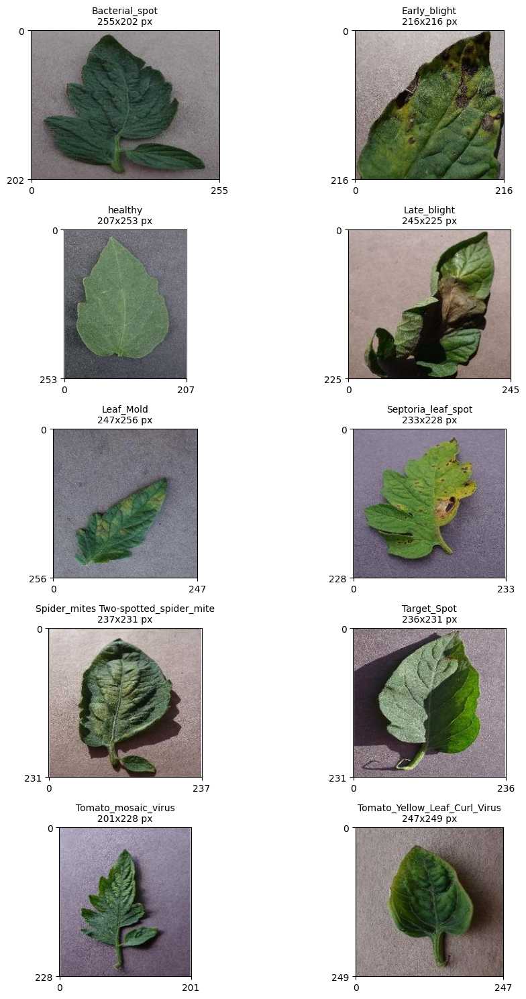

In [ ]:
def plot_tomato_samples(folder_path, rows=5, cols=2):
    """
    Menampilkan satu contoh gambar dari setiap subkategori "Tomato" dalam layout grid.
    Menampilkan grid dengan resolusi gambar (lebar x tinggi) untuk setiap gambar.

    Parameters:
    folder_path (str): Path ke folder utama yang berisi subfolder dari kelas "Tomato".
    rows (int): Jumlah baris pada grid plot.
    cols (int): Jumlah kolom pada grid plot.

    Returns:
    None
    """
    # List semua subfolder "Tomato"
    tomato_classes = [d for d in os.listdir(folder_path) if os.path.isdir(os.path.join(folder_path, d))]

    # Batasi jumlah kelas sesuai dengan grid (misal, 2 kolom x 5 baris = 10 gambar)
    selected_classes = tomato_classes[:rows * cols]

    fig, axes = plt.subplots(rows, cols, figsize=(10, 15))
    axes = axes.flatten()  # Meratakan axes agar lebih mudah diakses sebagai array

    for ax, class_name in zip(axes, selected_classes):
        class_path = os.path.join(folder_path, class_name)

        # Ambil satu gambar dari setiap subkategori
        image_name = os.listdir(class_path)[0]
        image_path = os.path.join(class_path, image_name)

        # Baca dan plot gambar
        with Image.open(image_path) as img:
            ax.imshow(img)
            ax.set_title(f"{class_name}\n{img.size[0]}x{img.size[1]} px", fontsize=10)
            ax.grid(True)
            ax.set_xticks([0, img.size[0]])
            ax.set_yticks([0, img.size[1]])
        ax.axis('on')

    plt.tight_layout()
    plt.show()


dataset_path = "dataset/raw/"
plot_tomato_samples(dataset_path)


## Split Dataset

Dataset Dibagi Menjadi 80% Train Set dan 20% Test Set. ✅

In [ ]:
def split_dataset(source_folder, train_folder, test_folder, train_ratio=0.8):
    """
    Membagi dataset menjadi Train Set dan Test Set berdasarkan rasio yang diberikan.

    Parameters:
    source_folder (str): Path ke folder utama yang berisi subfolder dari setiap kelas.
    train_folder (str): Path ke folder tujuan untuk menyimpan Train Set.
    test_folder (str): Path ke folder tujuan untuk menyimpan Test Set.
    train_ratio (float): Rasio untuk Train Set, defaultnya 0.8 (80% Train, 20% Test).

    Returns:
    None
    """

    os.makedirs(train_folder, exist_ok=True)
    os.makedirs(test_folder, exist_ok=True)

    # List subfolder sebagai kelas
    classes = [d for d in os.listdir(source_folder) if os.path.isdir(os.path.join(source_folder, d))]

    for class_name in tqdm(classes, desc="Splitting dataset"):
        class_path = os.path.join(source_folder, class_name)
        images = [f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))]

        # Acak urutan gambar
        random.shuffle(images)

        # Hitung jumlah gambar untuk Train dan Test
        train_count = int(len(images) * train_ratio)
        train_images = images[:train_count]
        test_images = images[train_count:]

        # Folder tujuan untuk kelas ini di Train dan Test Set
        train_class_path = os.path.join(train_folder, class_name)
        test_class_path = os.path.join(test_folder, class_name)
        os.makedirs(train_class_path, exist_ok=True)
        os.makedirs(test_class_path, exist_ok=True)

        # Salin gambar ke Train Set
        for image_name in train_images:
            source_image_path = os.path.join(class_path, image_name)
            target_image_path = os.path.join(train_class_path, image_name)
            shutil.copy(source_image_path, target_image_path)

        # Salin gambar ke Test Set
        for image_name in test_images:
            source_image_path = os.path.join(class_path, image_name)
            target_image_path = os.path.join(test_class_path, image_name)
            shutil.copy(source_image_path, target_image_path)


source_folder = "dataset/raw/"       # Folder dataset asli
train_folder = "dataset/train/"      # Folder untuk Train Set
test_folder = "dataset/test/"        # Folder untuk Test Set
split_dataset(source_folder, train_folder, test_folder)


Splitting dataset: 100%|██████████| 10/10 [03:03<00:00, 18.30s/it]


# Dataset Augmentation

In [ ]:
def create_data_generators(train_dir, test_dir, target_size=(160, 160), batch_size=32):
    """
    Membuat data generators untuk Train Set dan Test Set menggunakan ImageDataGenerator.
    Train Set akan dilakukan augmentasi, rescaling, dan perubahan target size,
    sedangkan Test Set hanya akan dilakukan rescaling.

    Parameters:
    train_dir (str): Path ke folder Train Set.
    test_dir (str): Path ke folder Test Set.
    target_size (tuple): Ukuran target gambar (width, height).
    batch_size (int): Jumlah batch untuk generator.

    Returns:
    train_generator, test_generator: Generator untuk Train Set dan Test Set.
    """

    # Augmentasi dan Rescale untuk Train Set
    train_datagen = ImageDataGenerator(
        rescale=1.0/255,                # Normalisasi gambar ke [0, 1]
        rotation_range=20,              # Rotasi gambar secara acak hingga 20 derajat
        zoom_range=0.2,                 # Zoom gambar secara acak
        horizontal_flip=True,           # Membalik gambar secara horizontal
        fill_mode='nearest'             # Metode pengisian untuk area kosong setelah transformasi
    )

    # Hanya Rescale untuk Test Set
    test_datagen = ImageDataGenerator(rescale=1.0/255)

    # Generator untuk Train Set
    train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=target_size,        # Mengubah ukuran gambar ke target size
        batch_size=batch_size,
        class_mode='categorical'
    )

    # Generator untuk Test Set
    test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=target_size,        # Mengubah ukuran gambar ke target size
        batch_size=batch_size,
        class_mode='categorical'
    )

    return train_generator, test_generator

train_dir = "dataset/train"
test_dir = "dataset/test"
train_generator, test_generator = create_data_generators(train_dir, test_dir)


Found 14523 images belonging to 10 classes.
Found 3637 images belonging to 10 classes.


In [ ]:
class_indices = train_generator.class_indices
print(class_indices)

{'Bacterial_spot': 0, 'Early_blight': 1, 'Late_blight': 2, 'Leaf_Mold': 3, 'Septoria_leaf_spot': 4, 'Spider_mites Two-spotted_spider_mite': 5, 'Target_Spot': 6, 'Tomato_Yellow_Leaf_Curl_Virus': 7, 'Tomato_mosaic_virus': 8, 'healthy': 9}


# Modelling

In [ ]:
class StopAtAccuracy(Callback):
    def __init__(self, target_accuracy=0.98):
        super(StopAtAccuracy, self).__init__()
        self.target_accuracy = target_accuracy

    def on_epoch_end(self, epoch, logs=None):
        train_acc = logs.get('accuracy')
        val_acc = logs.get('val_accuracy')

        # Cek apakah train dan val acc sudah mencapai target_accuracy
        if train_acc >= self.target_accuracy and val_acc >= self.target_accuracy:
            print(f"\nAkurasi train dan val mencapai {self.target_accuracy * 100}%, menghentikan pelatihan.")
            self.model.stop_training = True

# Callback untuk menghentikan training ketika train acc dan val acc >= 98%
callbacks = [
    StopAtAccuracy(target_accuracy=0.98),
    ModelCheckpoint('best_model.keras', monitor='val_accuracy', save_best_only=True, mode='max')
]

Mengimplementasikan Callback. ✅

In [ ]:
def build_model_with_transfer_learning(input_shape, num_classes):
    pre_trained_model = MobileNetV2(weights="imagenet", include_top=False, input_shape=input_shape)

    # Membekukan sebagian besar layer awal MobileNetV2
    for layer in pre_trained_model.layers[:100]:
        layer.trainable = False
    for layer in pre_trained_model.layers[100:]:
        layer.trainable = True

    model = Sequential([
        pre_trained_model,

        # Tambahan Conv2D dan Pooling layer
        Conv2D(32, (3, 3), activation='relu', padding='same'),
        MaxPooling2D((2, 2)),

        Conv2D(64, (3, 3), activation='relu', padding='same'),
        MaxPooling2D((2, 2)),

        Flatten(),
        Dropout(0.5),
        Dense(128, activation="relu", kernel_regularizer=tf.keras.regularizers.l2(0.01)),
        Dense(num_classes, activation='softmax')
    ])

    # Menggunakan learning rate yang lebih rendah
    model.compile(optimizer=Adam(learning_rate=1e-5),
                loss='categorical_crossentropy',
                metrics=['accuracy'])

    return model

# Latihan model
input_shape = (160, 160, 3)
num_classes = len(train_generator.class_indices)

model   = build_model_with_transfer_learning(input_shape, num_classes)
history = model.fit(
    train_generator,
    validation_data=test_generator,
    epochs=50,
    callbacks=callbacks,
    verbose=1
)

Epoch 1/50


c:\Users\melli\anaconda3\envs\MIS\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


454/454 ━━━━━━━━━━━━━━━━━━━━ 820s 2s/step - accuracy: 0.1923 - loss: 3.1499 - val_accuracy: 0.3511 - val_loss: 2.5321
Epoch 2/50
454/454 ━━━━━━━━━━━━━━━━━━━━ 315s 689ms/step - accuracy: 0.4357 - loss: 2.4655 - val_accuracy: 0.6280 - val_loss: 2.0565
Epoch 3/50
454/454 ━━━━━━━━━━━━━━━━━━━━ 358s 784ms/step - accuracy: 0.5669 - loss: 2.1149 - val_accuracy: 0.7382 - val_loss: 1.7155
Epoch 4/50
454/454 ━━━━━━━━━━━━━━━━━━━━ 308s 673ms/step - accuracy: 0.6641 - loss: 1.8463 - val_accuracy: 0.7924 - val_loss: 1.5282
Epoch 5/50
454/454 ━━━━━━━━━━━━━━━━━━━━ 331s 723ms/step - accuracy: 0.7231 - loss: 1.6479 - val_accuracy: 0.8240 - val_loss: 1.3622
Epoch 6/50
454/454 ━━━━━━━━━━━━━━━━━━━━ 308s 675ms/step - accuracy: 0.7665 - loss: 1.5083 - val_accuracy: 0.8518 - val_loss: 1.2573
Epoch 7/50
454/454 ━━━━━━━━━━━━━━━━━━━━ 320s 702ms/step - accuracy: 0.7967 - loss: 1.3964 - val_accuracy: 0.8688 - val_loss: 1.1738
Epoch 8/50
454/454 ━━━━━━━━━━━━━━━━━━━━ 347s 756ms/step - accuracy: 0.8341 - loss: 1.2999 

# Evaluation

In [ ]:
def evaluate_model_performance(model, train_generator, test_generator):
    """
    Mengevaluasi model yang telah dilatih pada training dan testing set, dan menampilkan
    akurasi serta loss masing-masing.

    Parameters:
    model (tf.keras.Model): Model yang telah dilatih.
    train_generator (tf.keras.preprocessing.image.ImageDataGenerator): Generator untuk training set.
    test_generator (tf.keras.preprocessing.image.ImageDataGenerator): Generator untuk testing set.

    Returns:
    None
    """
    # Evaluasi model pada training set
    train_loss, train_accuracy = model.evaluate(train_generator, verbose=1)
    print(f"Training Accuracy: {train_accuracy:.2%}")
    print(f"Training Loss: {train_loss:.4f}")

    print("-------------")

    # Evaluasi model pada testing set
    test_loss, test_accuracy = model.evaluate(test_generator, verbose=1)
    print(f"Testing Accuracy: {test_accuracy:.2%}")
    print(f"Testing Loss: {test_loss:.4f}")

evaluate_model_performance(model, train_generator, test_generator)


454/454 ━━━━━━━━━━━━━━━━━━━━ 198s 435ms/step - accuracy: 0.9976 - loss: 0.3743
Training Accuracy: 99.70%
Training Loss: 0.3754
-------------
114/114 ━━━━━━━━━━━━━━━━━━━━ 33s 291ms/step - accuracy: 0.9631 - loss: 0.4993
Testing Accuracy: 96.21%
Testing Loss: 0.5071


Akurasi pada training set dan validation set minimal 95%. ✅

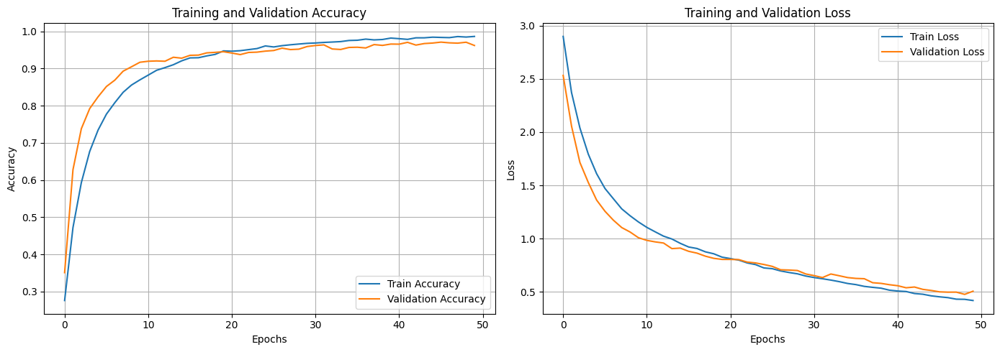

In [ ]:
def plot_training_history(history):
    """
    Membuat plot terhadap akurasi dan loss model selama proses training.

    Parameters:
    history: History object yang dikembalikan oleh model.fit().

    Returns:
    None
    """
    # Plot akurasi
    plt.figure(figsize=(14, 5))

    # Plot akurasi training dan validasi
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    # Plot loss training dan validasi
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

plot_training_history(history)

# Model Convertion

In [ ]:
def save_model_in_formats(model, path_h5, path_keras):
    """
    Menyimpan model dalam format .h5 dan .keras.

    Parameters:
    model (tf.keras.Model): Model yang telah dilatih.
    path_h5 (str): Path untuk menyimpan model dalam format .h5.
    path_keras (str): Path untuk menyimpan model dalam format .keras.

    Returns:
    None
    """
    # Menyimpan model dalam format .h5
    model.save(path_h5)
    print(f"Model berhasil disimpan dalam format .h5 di {path_h5}")

    # Menyimpan model dalam format .keras
    model.save(path_keras)
    print(f"Model berhasil disimpan dalam format .keras di {path_keras}")

save_model_in_formats(model, "model_saved/model.h5", "model_saved/model.keras")

Model berhasil disimpan dalam format .h5 di model_saved/model.h5
Model berhasil disimpan dalam format .keras di model_saved/model.keras


In [ ]:
import h5py

with h5py.File('model.h5', 'r') as f:
    print(f.keys())

<KeysViewHDF5 ['model_weights', 'optimizer_weights']>


## SavedModel

In [ ]:
def save_as_saved_model(model, path):
    """
    Menyimpan model dalam format SavedModel.

    Parameters:
    model (tf.keras.Model): Model yang telah dilatih.
    path (str): Lokasi penyimpanan model dalam format SavedModel.

    Returns:
    None
    """
    model.export(path)
    print(f"Model berhasil disimpan dalam format SavedModel di {path}")

# Contoh penggunaan
path = "saved_model/my_model"
save_as_saved_model(model, path)


INFO:tensorflow:Assets written to: saved_model/my_model\assets


INFO:tensorflow:Assets written to: saved_model/my_model\assets


Saved artifact at 'saved_model/my_model'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 160, 160, 3), dtype=tf.float32, name='keras_tensor_318')
Output Type:
  TensorSpec(shape=(None, 10), dtype=tf.float32, name=None)
Captures:
  2834476258048: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2834476259984: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2834476260336: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2834476259456: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2834476259632: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2834476267296: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2834476269232: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2834476281920: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2834476268704: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2834476268880: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2834476284736: TensorSpec

## TF-Lite

In [ ]:
def save_as_tflite(model, path):
    """
    Mengonversi dan menyimpan model dalam format TF-Lite.

    Parameters:
    model (tf.keras.Model): Model yang telah dilatih.
    path (str): Lokasi penyimpanan model dalam format TF-Lite.

    Returns:
    None
    """
    # Mengonversi model ke format TF-Lite
    converter = tf.lite.TFLiteConverter.from_keras_model(model)
    tflite_model = converter.convert()

    # Menyimpan model dalam format TF-Lite
    with open(path, "wb") as f:
        f.write(tflite_model)
    print(f"Model berhasil disimpan dalam format TF-Lite di {path}")

path="tflite_model/my_model.tflite"
save_as_tflite(model, path)

INFO:tensorflow:Assets written to: C:\Users\melli\AppData\Local\Temp\tmpjd8cvfre\assets


INFO:tensorflow:Assets written to: C:\Users\melli\AppData\Local\Temp\tmpjd8cvfre\assets


Saved artifact at 'C:\Users\melli\AppData\Local\Temp\tmpjd8cvfre'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 160, 160, 3), dtype=tf.float32, name='keras_tensor_318')
Output Type:
  TensorSpec(shape=(None, 10), dtype=tf.float32, name=None)
Captures:
  2834476258048: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2834476259984: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2834476260336: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2834476259456: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2834476259632: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2834476267296: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2834476269232: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2834476281920: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2834476268704: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2834476268880: TensorSpec(shape=(), dtype=tf.resource, name=None)
  

## TF-JS

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!tensorflowjs_converter --input_format=tf_saved_model --output_node_names='output_node' drive/MyDrive/model/saved_model/my_model/ tfjs_model/

2024-11-11 02:08:14.006698: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1731290894.032667   29439 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1731290894.040793   29439 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
🌲 Try https://ydf.readthedocs.io, the successor of TensorFlow Decision Forests with more features and faster training!
2024-11-11 02:08:20.288118: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)
I0000 00:00:1731290907.090756   29439 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 0
I0000 00:00

# Inference

In [ ]:
def load_image(image_path, target_size=(160, 160)):
    """
    Memuat dan mengubah ukuran gambar untuk inferensi dengan model TF-Lite.

    Parameters:
    image_path (str): Path ke gambar yang akan diprediksi.
    target_size (tuple): Ukuran target gambar (width, height).

    Returns:
    np.array: Gambar yang telah diproses dan siap digunakan sebagai input untuk model.
    """
    # Memuat gambar
    img = Image.open(image_path).convert('RGB')

    # Mengubah ukuran gambar
    img = img.resize(target_size)

    # Mengonversi gambar ke array numpy dan melakukan normalisasi
    img_array = np.array(img) / 255.0  # Skala ke [0, 1]

    # Menambahkan dimensi batch
    img_array = np.expand_dims(img_array, axis=0)

    return img_array.astype(np.float32), img


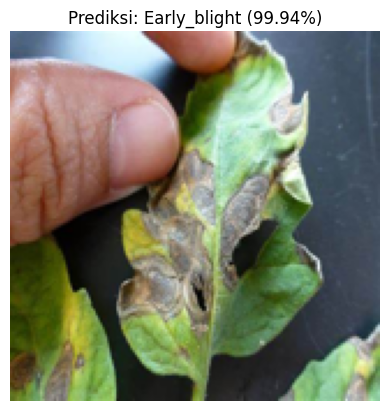

Melakukan inference menggunakan salah satu model (TF-Lite). ✅

In [3]:
!pipreqs --scan-notebooks

Please, verify manually the final list of requirements.txt to avoid possible dependency confusions.
Please, verify manually the final list of requirements.txt to avoid possible dependency confusions.
Please, verify manually the final list of requirements.txt to avoid possible dependency confusions.
INFO: Successfully saved requirements file in c:\Users\melli\Dropbox\PC\Downloads\di\Klasifikasi Gambar\requirements.txt
